>## Ограничение на $P_z$

In [95]:
from starter import *

>## Baseline

In [146]:
threshold = [0, 150]

X = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
y = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

In [147]:
y[y == 1].size

146

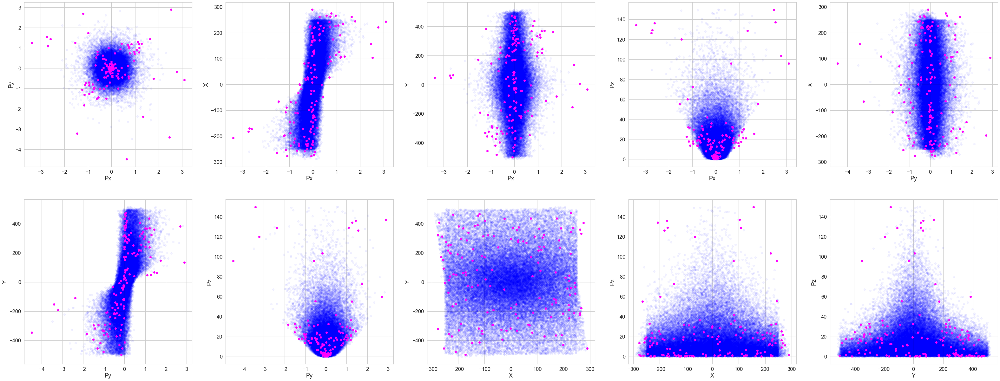

In [149]:
plt.figure(figsize=(55, 21))

pairs = combinations(['Px', 'Py', 'X', 'Y', 'Pz'], 2)

for num, pair in enumerate(pairs, 1):

    plt.subplot(2, 5, num)
    plt.scatter(X[y == 0][pair[0]], X[y == 0][pair[1]], alpha=0.05, color='blue')
    plt.scatter(X[y == 1][pair[0]], X[y == 1][pair[1]], color='magenta')
    plt.xlabel(pair[0])
    plt.ylabel(pair[1])

plt.show()

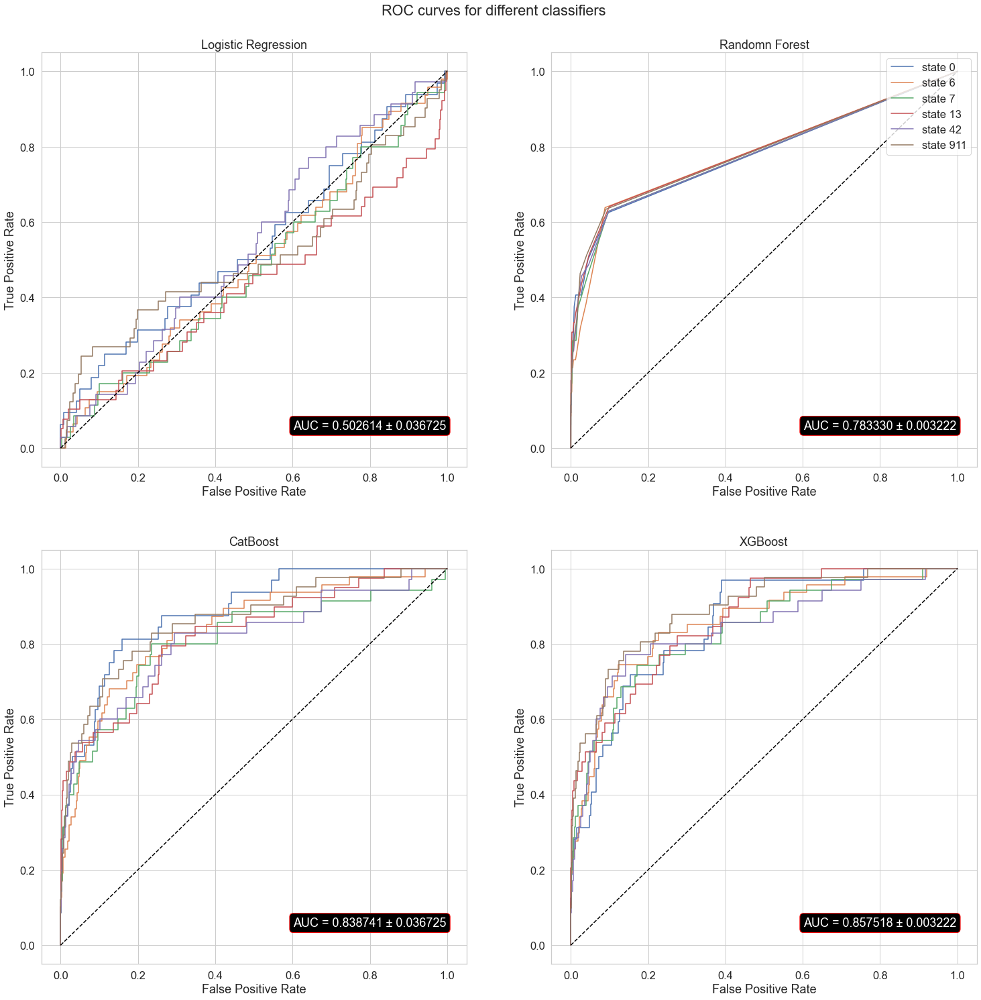

In [99]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

>## Первая группа

In [151]:
threshold = [50, 150]

X = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
y = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

In [152]:
y[y == 1].size

15

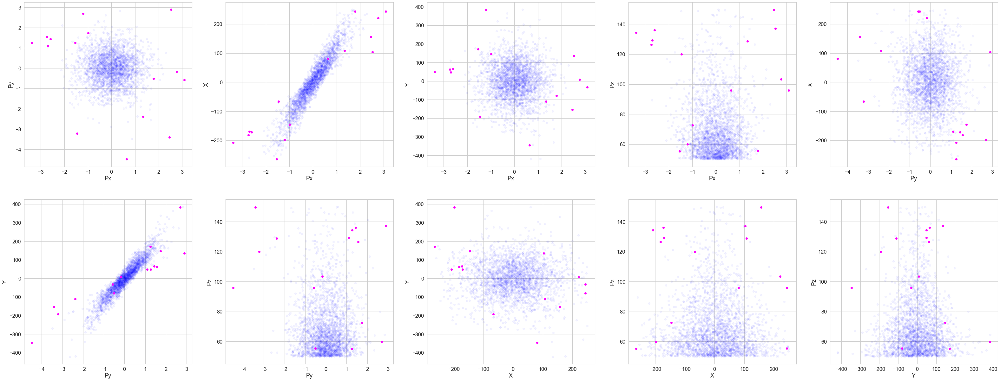

In [153]:
plt.figure(figsize=(55, 21))

pairs = combinations(['Px', 'Py', 'X', 'Y', 'Pz'], 2)

for num, pair in enumerate(pairs, 1):

    plt.subplot(2, 5, num)
    plt.scatter(X[y == 0][pair[0]], X[y == 0][pair[1]], alpha=0.05, color='blue')
    plt.scatter(X[y == 1][pair[0]], X[y == 1][pair[1]], color='magenta')
    plt.xlabel(pair[0])
    plt.ylabel(pair[1])

plt.show()

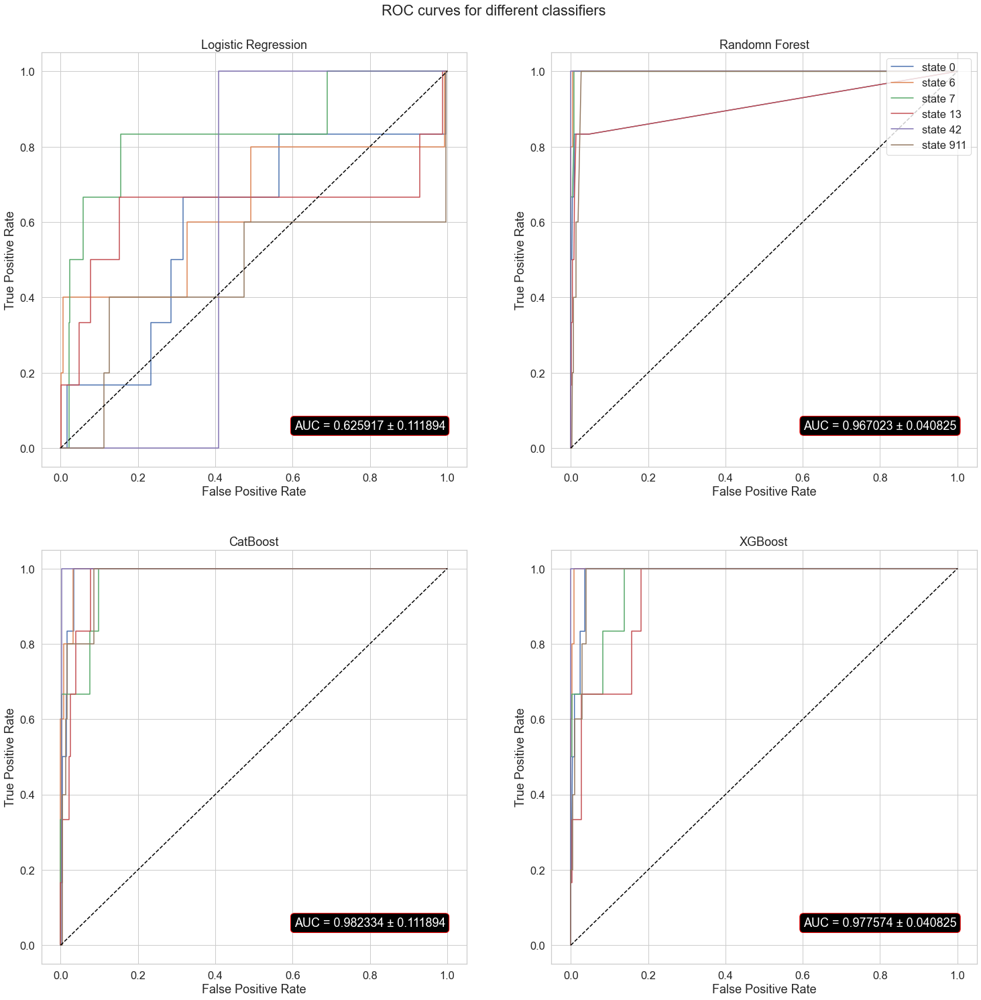

In [103]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

In [104]:
X['centr_dist1'] = X['Px'] ** 2 + X['Py'] ** 2
X['centr_dist2'] = X['Px'] ** 2 + X['Y'] ** 2
X['centr_dist2'] = X['Py'] ** 2 + X['X'] ** 2
X['centr_dist3'] = X['X'] ** 2 + X['Y'] ** 2

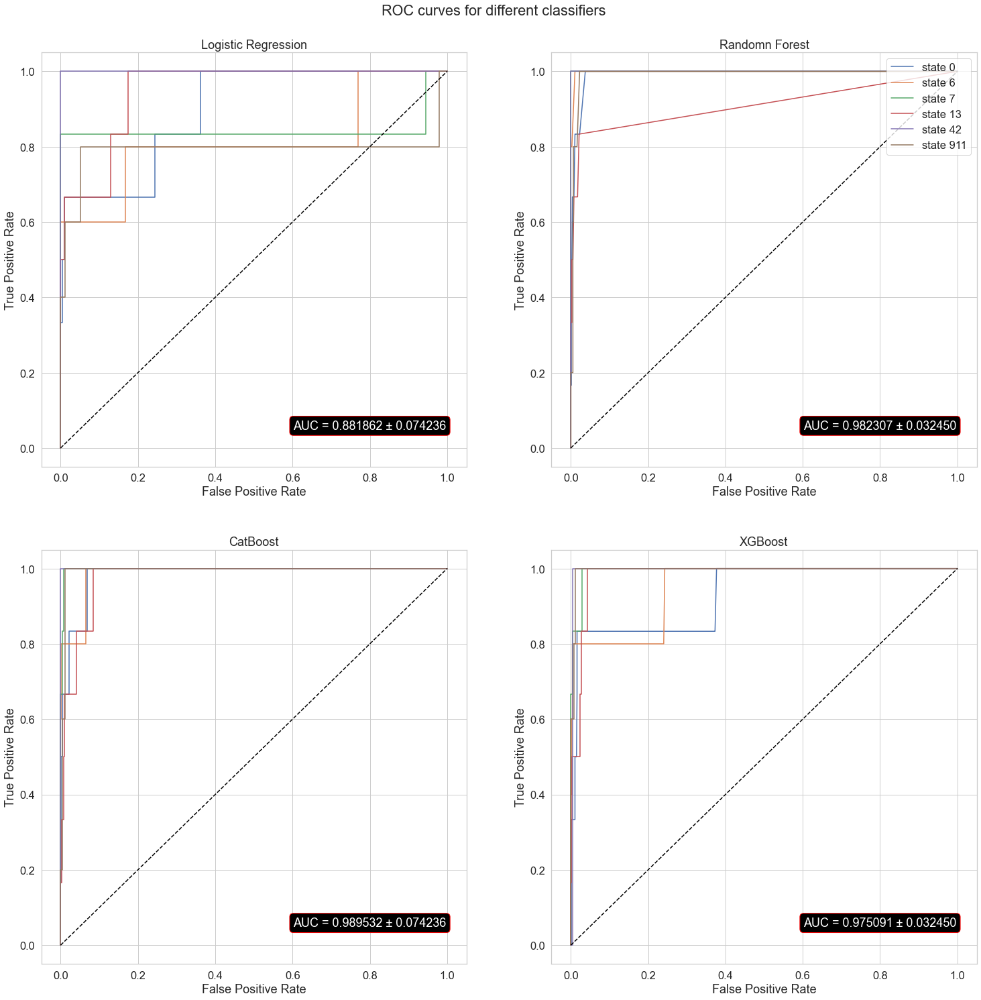

In [105]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

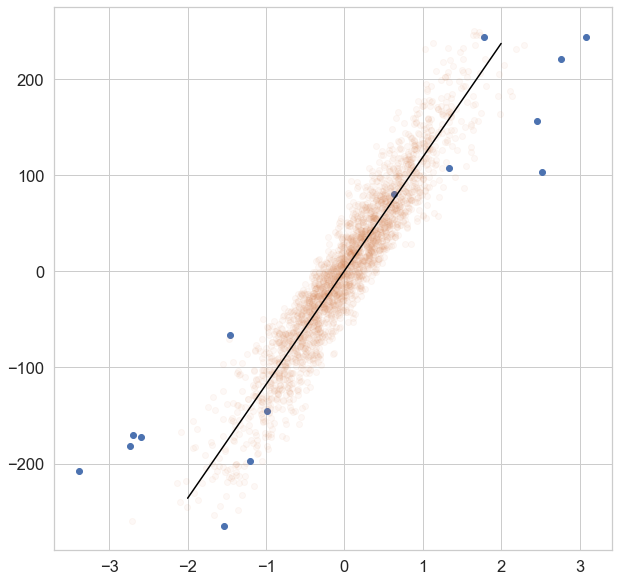

In [106]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Px'], X[y == 1]['X'])
plt.scatter(X[y == 0]['Px'], X[y == 0]['X'], alpha=0.05)

k1, b1 = np.polyfit(X[y == 0]['Px'], X[y == 0]['X'], deg=1)

x = np.linspace(-2, 2, 2)

plt.plot(x, k1 * x + b1, 'black')

plt.show()

In [107]:
X['line_dist1'] = np.abs((X['X'] -  (k1 * X['Px'] + b1)) / (k1 ** 2 + 1) ** 0.5)

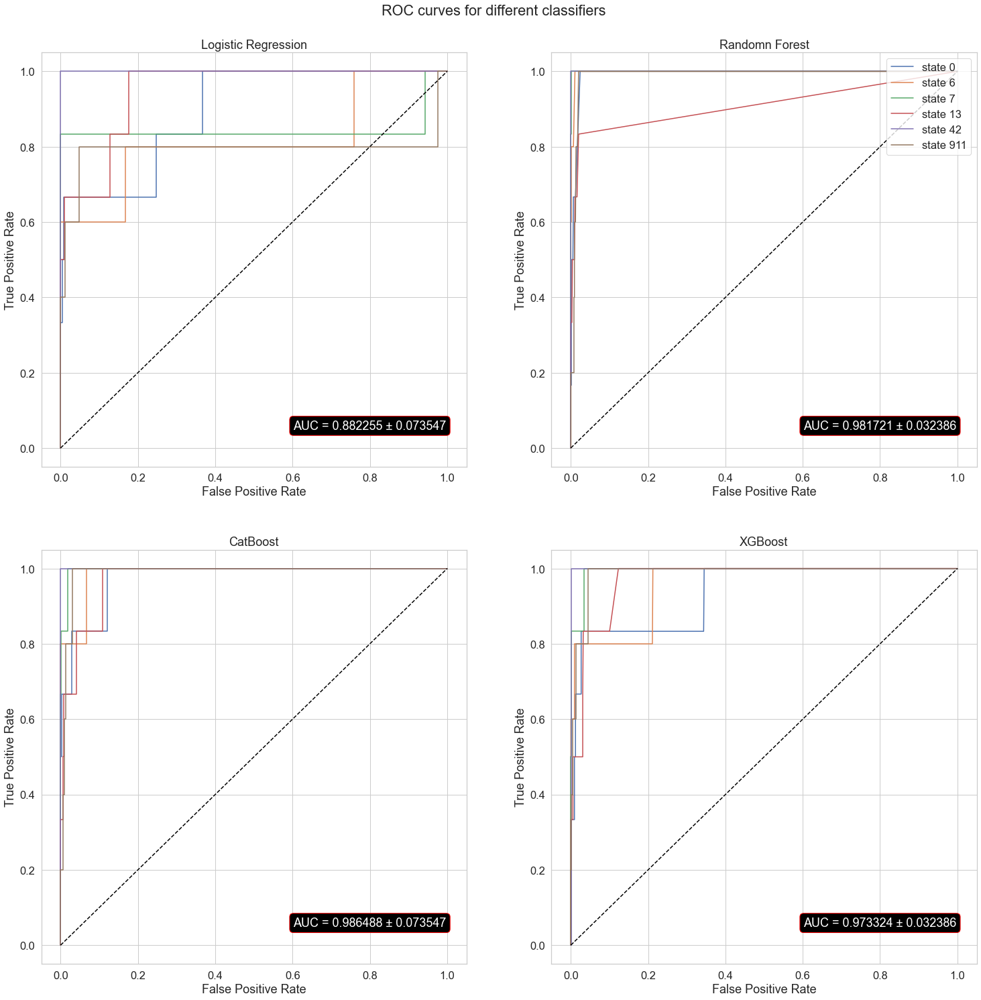

In [108]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

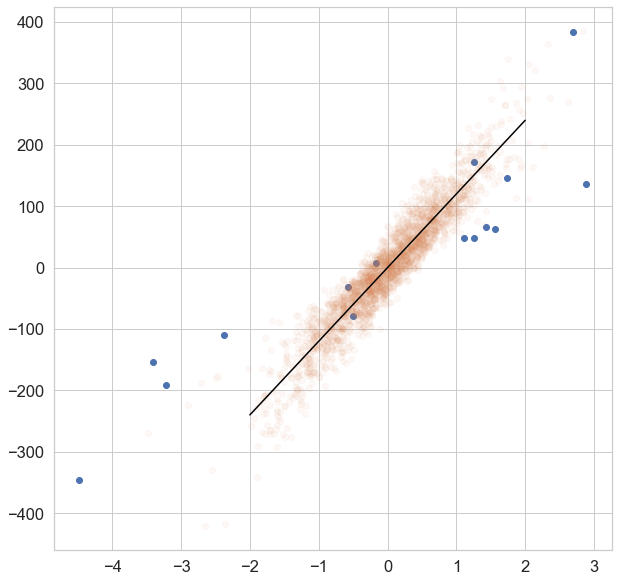

In [109]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Py'], X[y == 1]['Y'])
plt.scatter(X[y == 0]['Py'], X[y == 0]['Y'], alpha=0.05)

k2, b2 = np.polyfit(X[y == 0]['Py'], X[y == 0]['Y'], deg=1)

x = np.linspace(-2, 2, 2)

plt.plot(x, k2 * x + b2, 'black')

plt.show()

In [110]:
X['line_dist2'] = np.abs((X['Y'] -  (k2 * X['Py'] + b2)) / (k2 ** 2 + 1) ** 0.5)

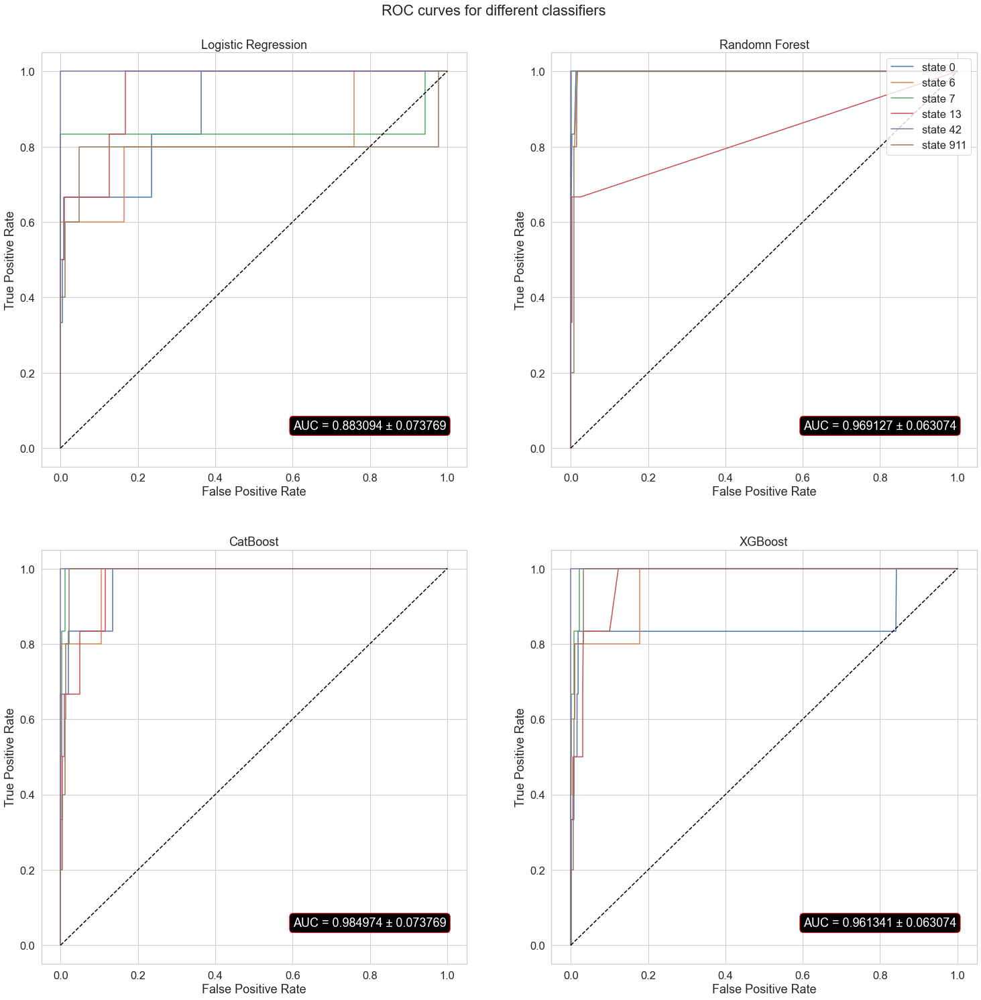

In [111]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

>SMOTE

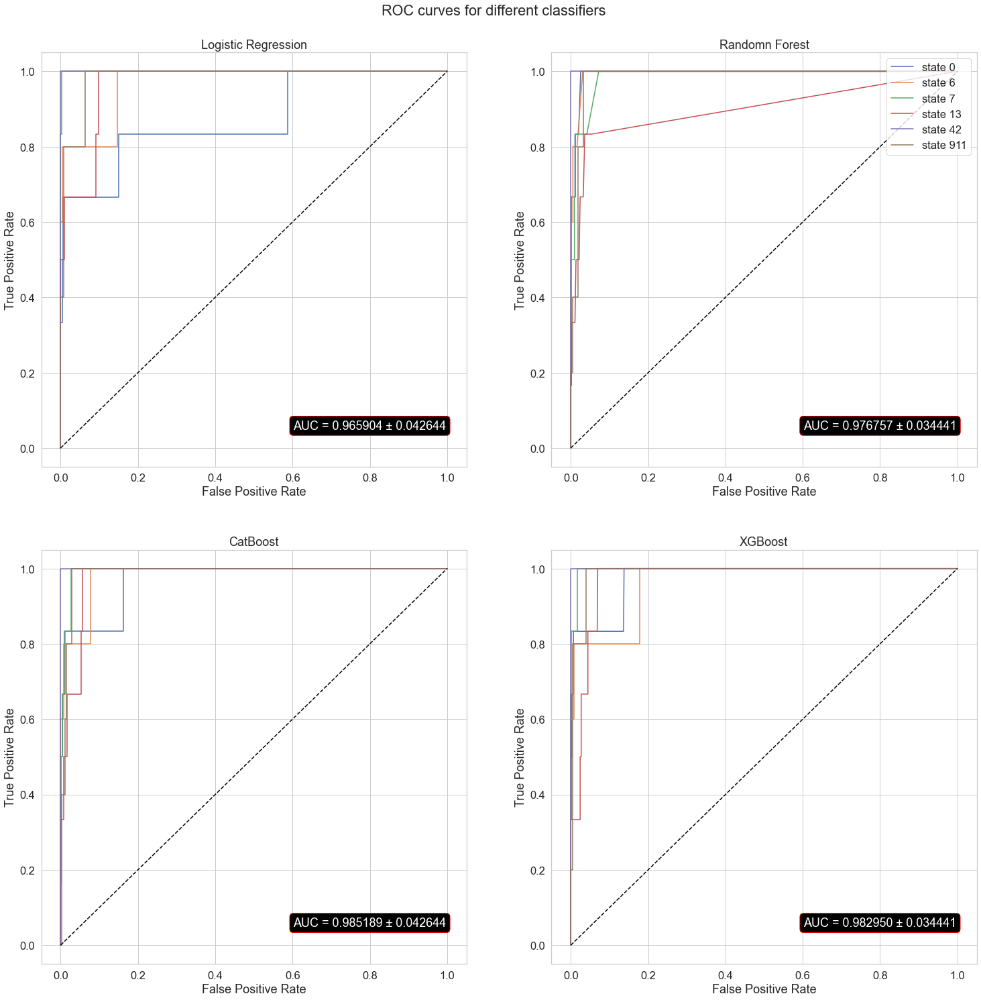

In [112]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=state)

    os = SMOTE(random_state=42, n_jobs=-1)

    columns = Xtrain.columns

    os_data_X, os_data_y = os.fit_resample(Xtrain, ytrain)

    os_data_X = pd.DataFrame(data=os_data_X, columns=columns)

    X_train.append(os_data_X)
    X_test.append(Xtest)
    y_train.append(os_data_y)
    y_test.append(ytest)

get_metrics(X_train, X_test, y_train, y_test)

>## Вторая группа

In [157]:
threshold = [10, 50]

X = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
y = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

In [158]:
y[y == 1].size

69

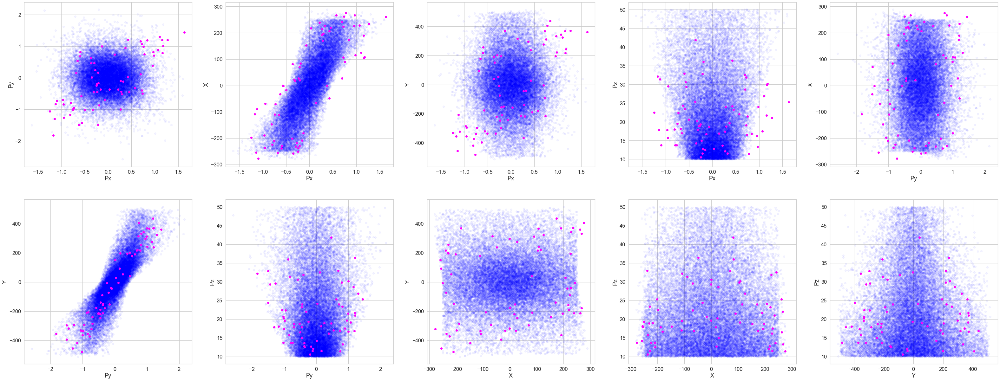

In [160]:
plt.figure(figsize=(55, 21))

pairs = combinations(['Px', 'Py', 'X', 'Y', 'Pz'], 2)

for num, pair in enumerate(pairs, 1):

    plt.subplot(2, 5, num)
    plt.scatter(X[y == 0][pair[0]], X[y == 0][pair[1]], alpha=0.05, color='blue')
    plt.scatter(X[y == 1][pair[0]], X[y == 1][pair[1]], color='magenta')
    plt.xlabel(pair[0])
    plt.ylabel(pair[1])

plt.show()

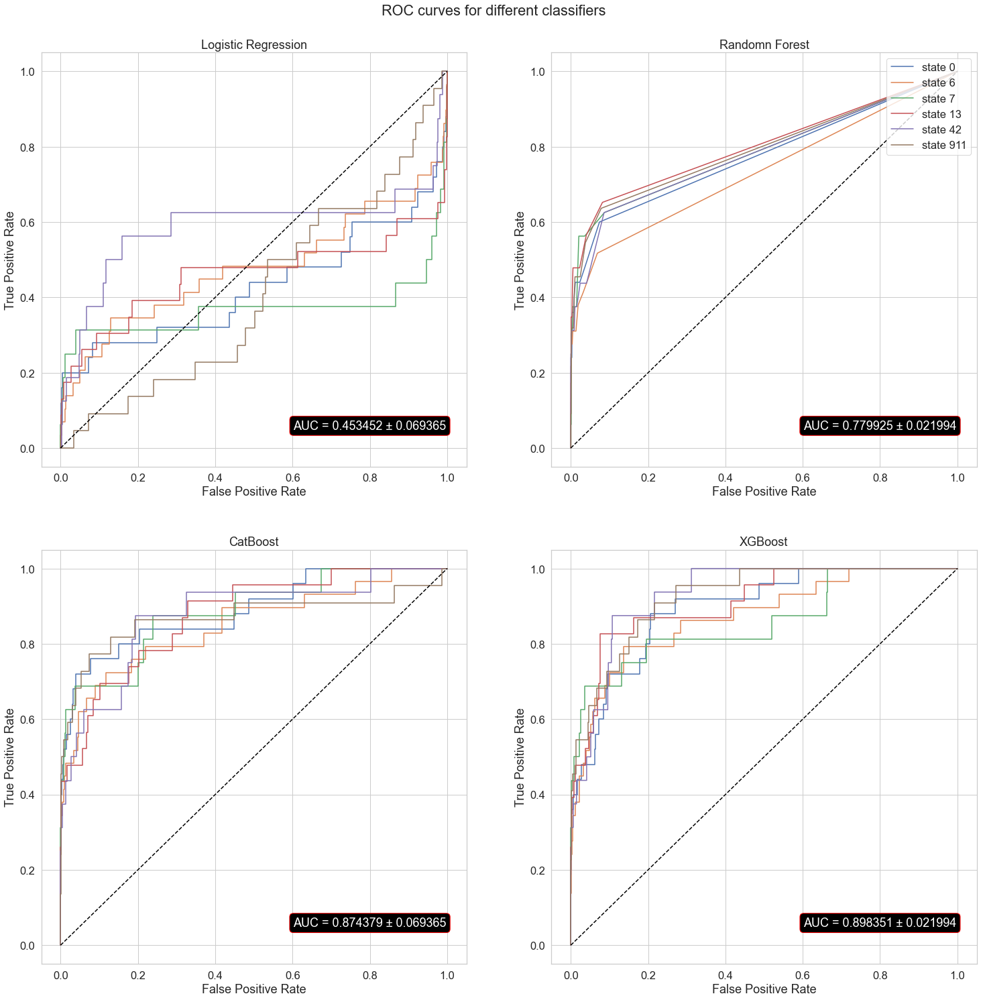

In [116]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

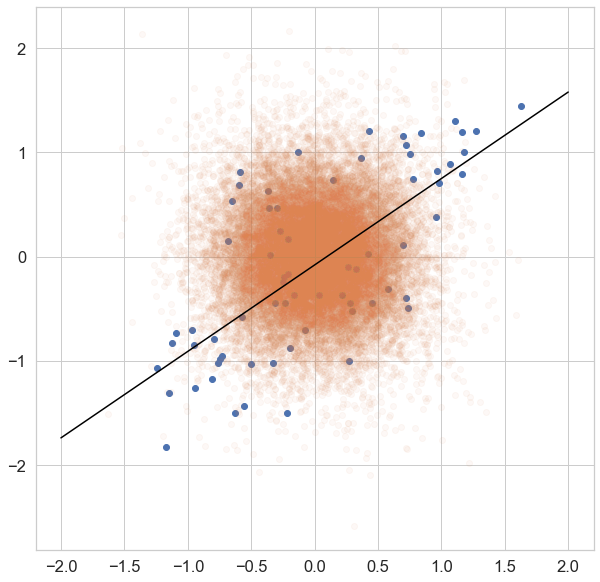

In [117]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Px'], X[y == 1]['Py'])
plt.scatter(X[y == 0]['Px'], X[y == 0]['Py'], alpha=0.05)

k1, b1 = np.polyfit(X[y == 1]['Px'], X[y == 1]['Py'], deg=1)

x = np.linspace(-2, 2, 2)

plt.plot(x, k1 * x + b1, 'black')

plt.show()

In [118]:
X['centr_dist1'] = X['Px'] ** 2 + X['Py'] ** 2
X['line_dist1'] = np.abs((X['Py'] -  (k1 * X['Px'] + b1)) / (k1 ** 2 + 1) ** 0.5)

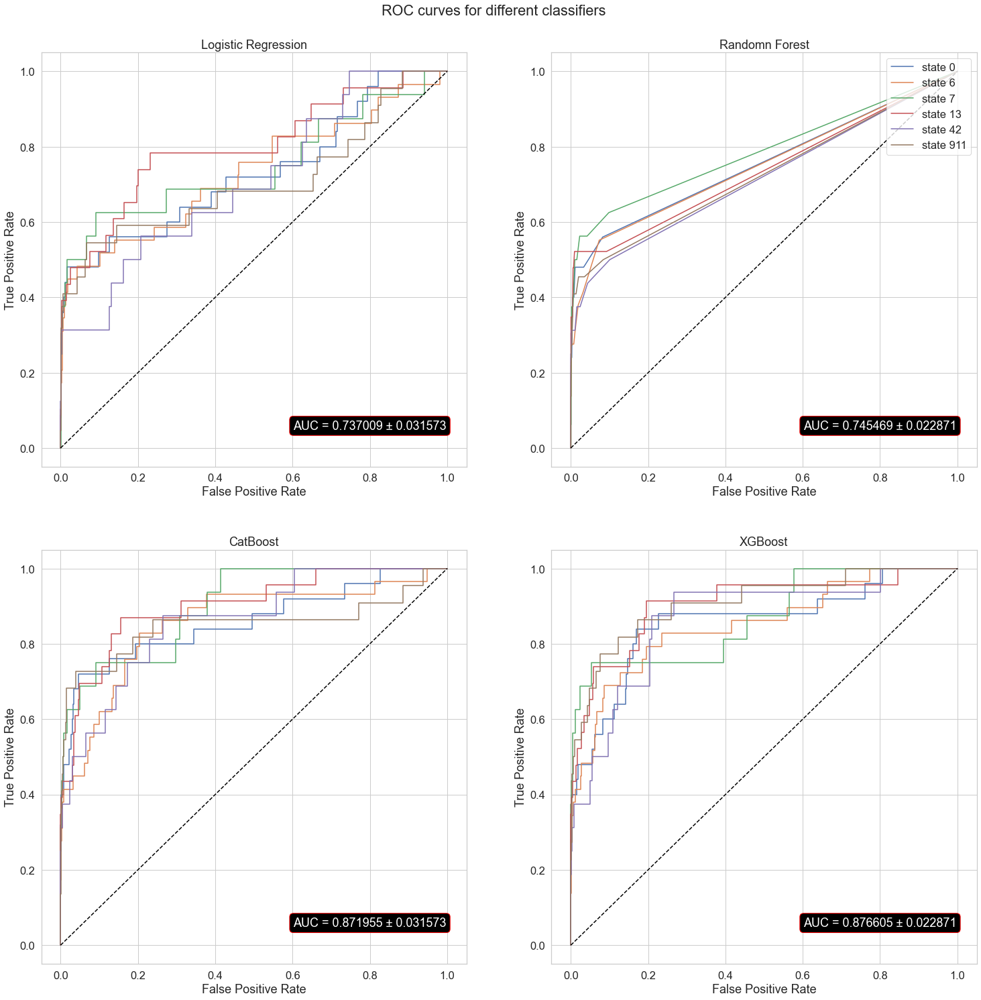

In [119]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X, y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

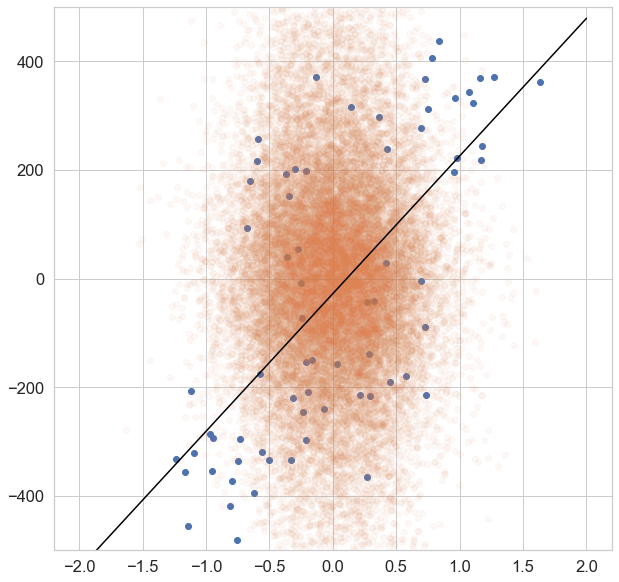

In [120]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Px'], X[y == 1]['Y'])
plt.scatter(X[y == 0]['Px'], X[y == 0]['Y'], alpha=0.05)

k2, b2 = np.polyfit(X[y == 1]['Px'], X[y == 1]['Y'], deg=1)

x = np.linspace(-2, 2, 2)

plt.plot(x, k2 * x + b2, 'black')

plt.ylim(-500, 500)

plt.show()

In [121]:
X['axis_dist_Px'] = np.abs(X['Px'])

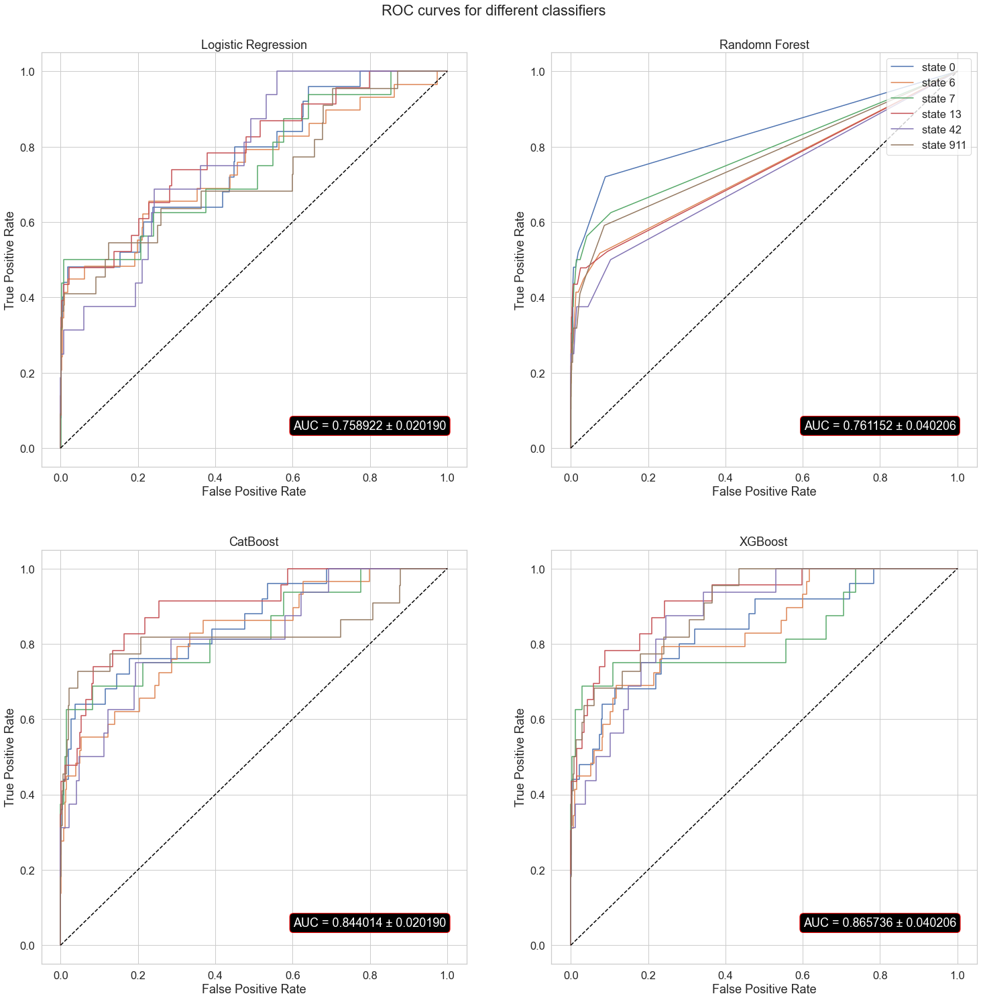

In [122]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

>SMOTE

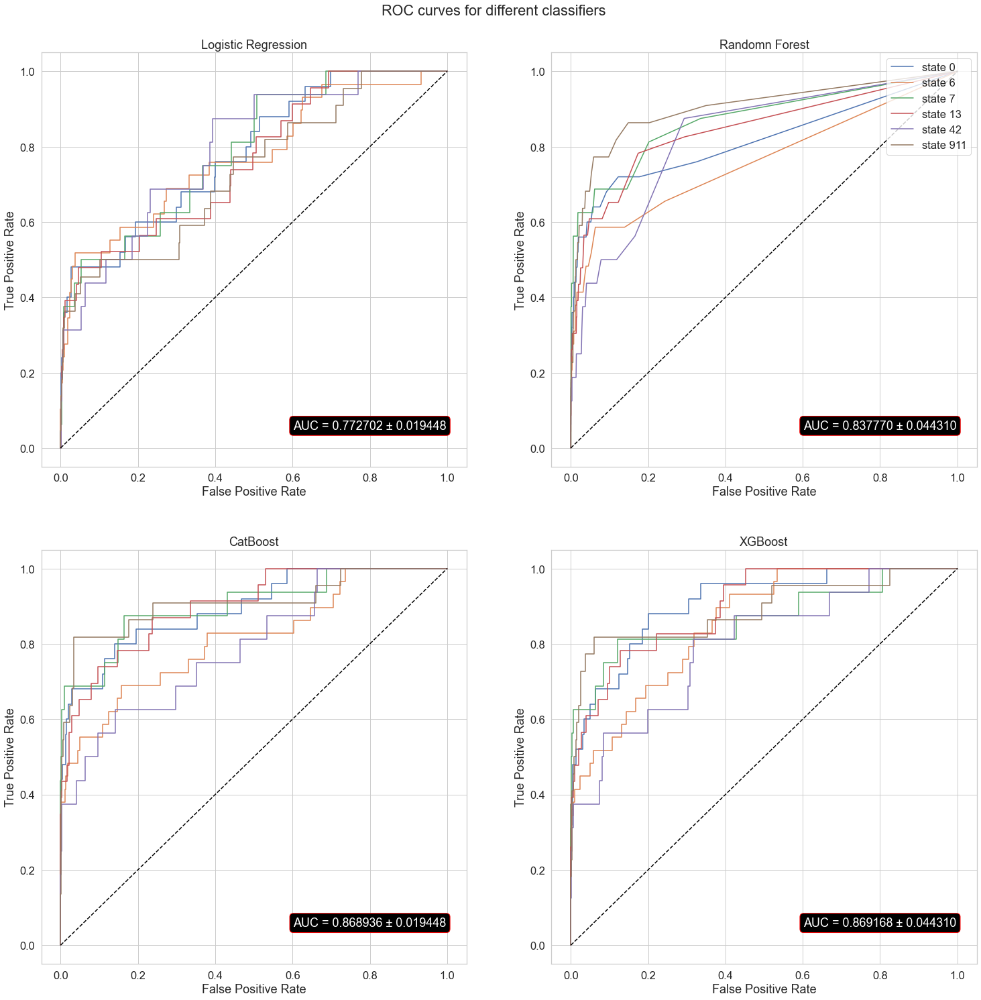

In [123]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=state)

    os = SMOTE(random_state=42, n_jobs=-1)

    columns = Xtrain.columns

    os_data_X, os_data_y = os.fit_resample(Xtrain, ytrain)

    os_data_X = pd.DataFrame(data=os_data_X, columns=columns)

    X_train.append(os_data_X)
    X_test.append(Xtest)
    y_train.append(os_data_y)
    y_test.append(ytest)

get_metrics(X_train, X_test, y_train, y_test)

>## Третья группа

In [154]:
threshold = [0, 10]

X = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
y = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

In [155]:
y[y == 1].size

62

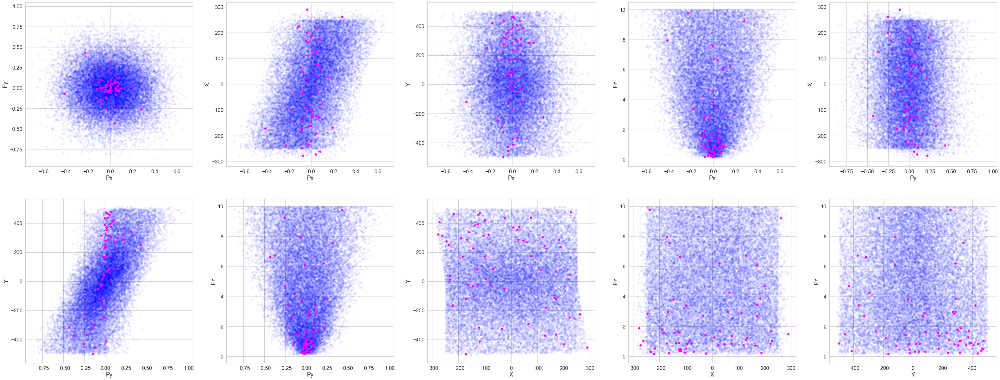

In [156]:
plt.figure(figsize=(55, 21))

pairs = combinations(['Px', 'Py', 'X', 'Y', 'Pz'], 2)

for num, pair in enumerate(pairs, 1):

    plt.subplot(2, 5, num)
    plt.scatter(X[y == 0][pair[0]], X[y == 0][pair[1]], alpha=0.05, color='blue')
    plt.scatter(X[y == 1][pair[0]], X[y == 1][pair[1]], color='magenta')
    plt.xlabel(pair[0])
    plt.ylabel(pair[1])

plt.show()

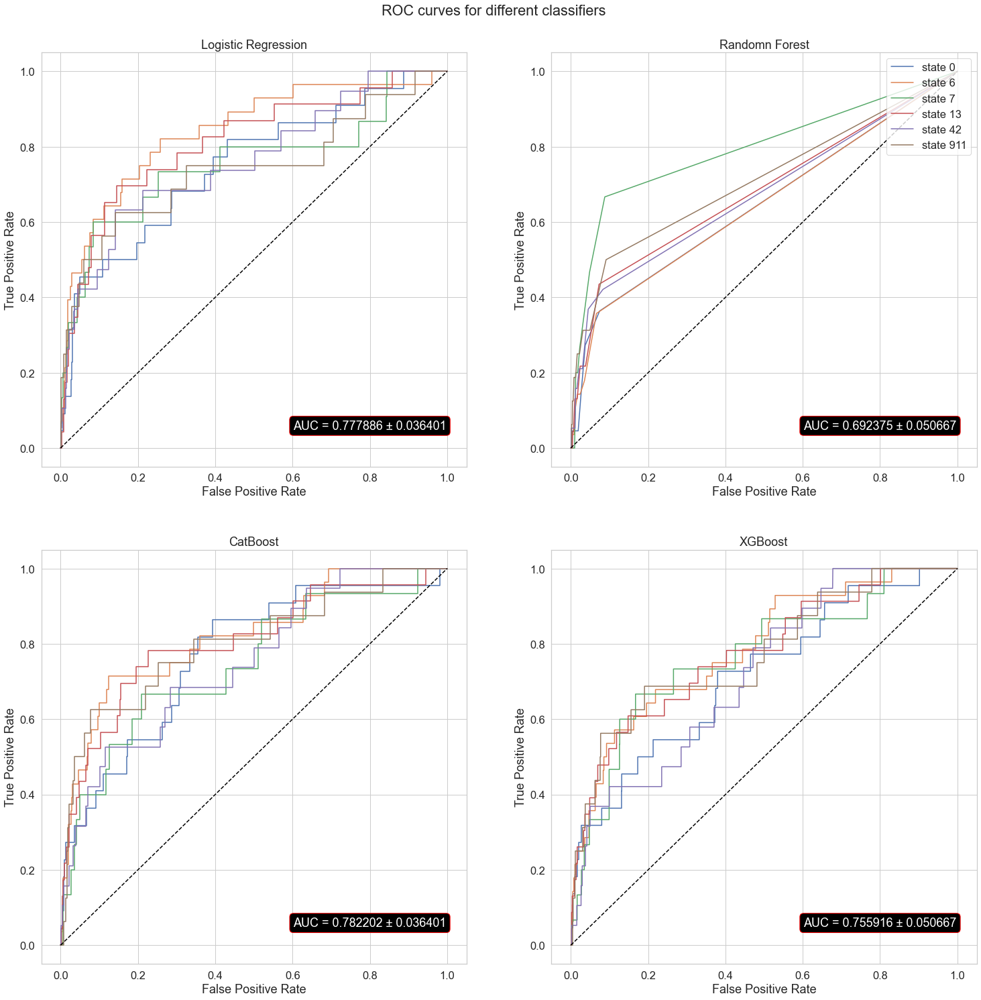

In [127]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

In [128]:
X['centr_dist1'] = X['Px'] ** 2 + X['Py'] ** 2
X['axis_dist_Px'] = np.abs(X['Px'])
X['axis_dist_Py'] = np.abs(X['Py'])

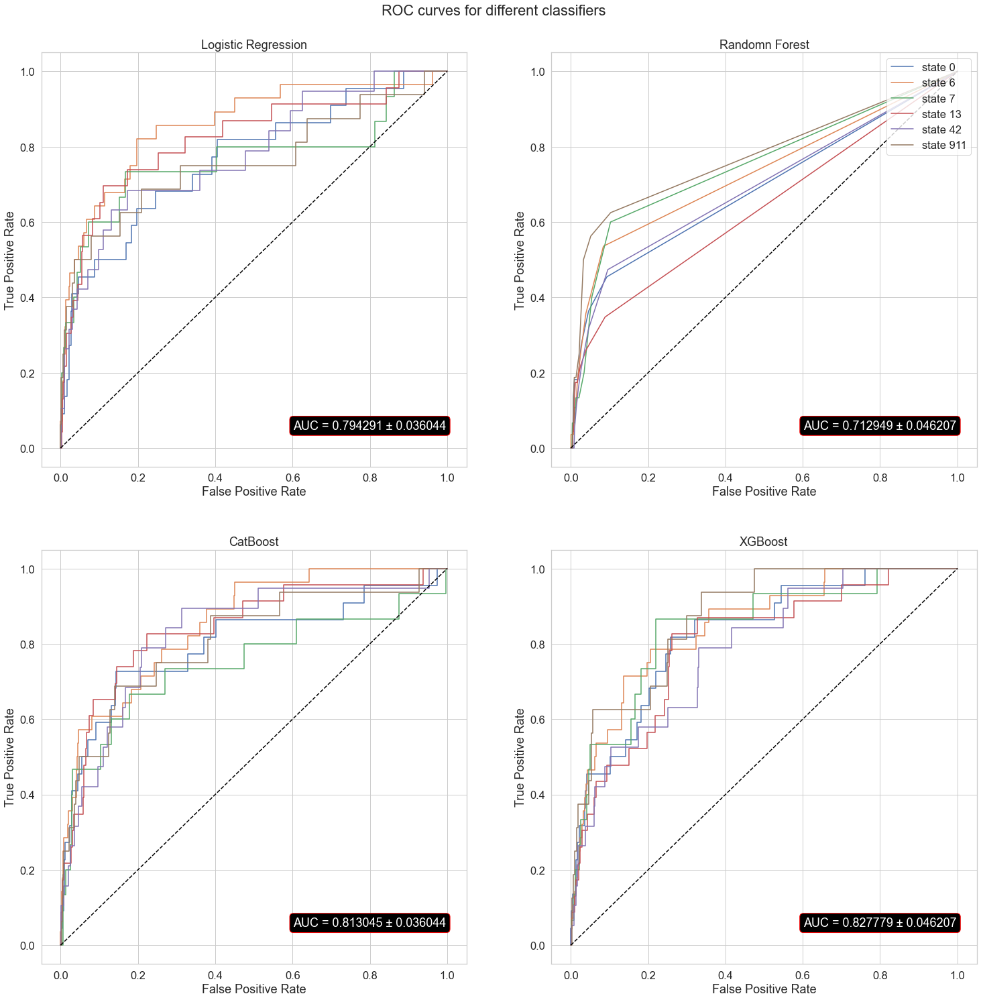

In [129]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

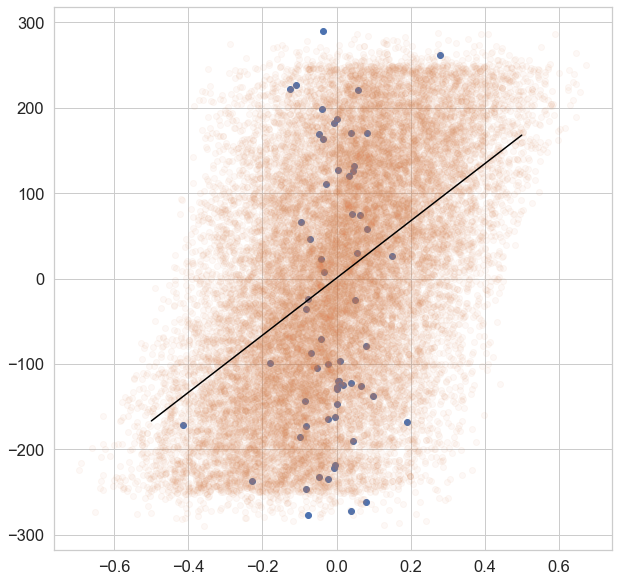

In [130]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Px'], X[y == 1]['X'])
plt.scatter(X[y == 0]['Px'], X[y == 0]['X'], alpha=0.05)

k1, b1 = np.polyfit(X[y == 0]['Px'], X[y == 0]['X'], deg=1)

x = np.linspace(-0.5, 0.5, 2)

plt.plot(x, k1 * x + b1, 'black')

plt.show()

In [131]:
X['line_dist1'] = np.abs((X['X'] -  (k1 * X['Px'] + b1)) / (k1 ** 2 + 1) ** 0.5)

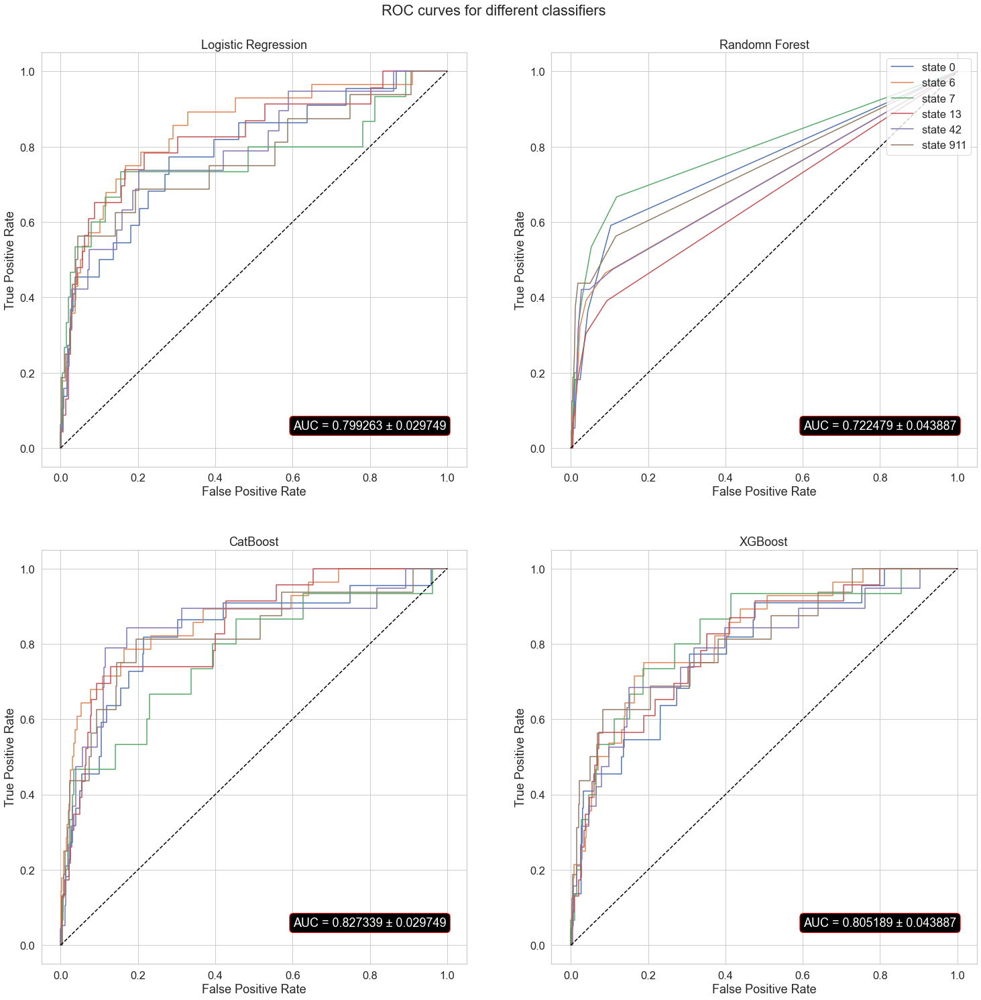

In [132]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

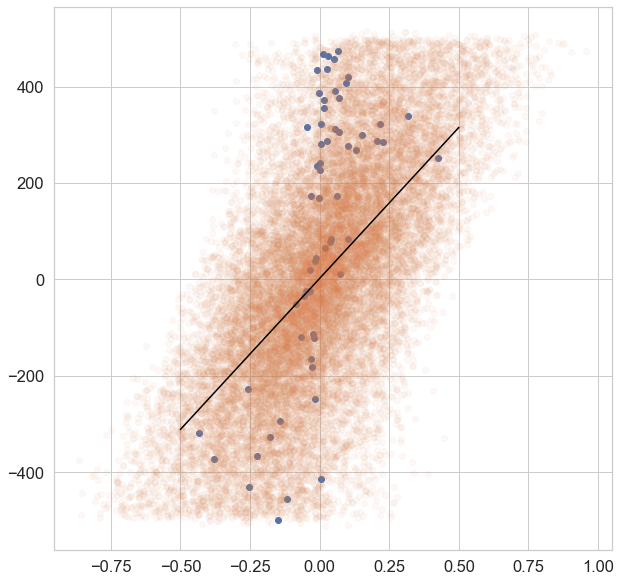

In [133]:
plt.figure(figsize=(10, 10))

plt.scatter(X[y == 1]['Py'], X[y == 1]['Y'])
plt.scatter(X[y == 0]['Py'], X[y == 0]['Y'], alpha=0.05)

k2, b2 = np.polyfit(X[y == 0]['Py'], X[y == 0]['Y'], deg=1)

x = np.linspace(-0.5, 0.5, 2)

plt.plot(x, k2 * x + b2, 'black')

plt.show()

In [134]:
X['line_dist2'] = np.abs((X['Y'] -  (k2 * X['Py'] + b2)) / (k2 ** 2 + 1) ** 0.5)

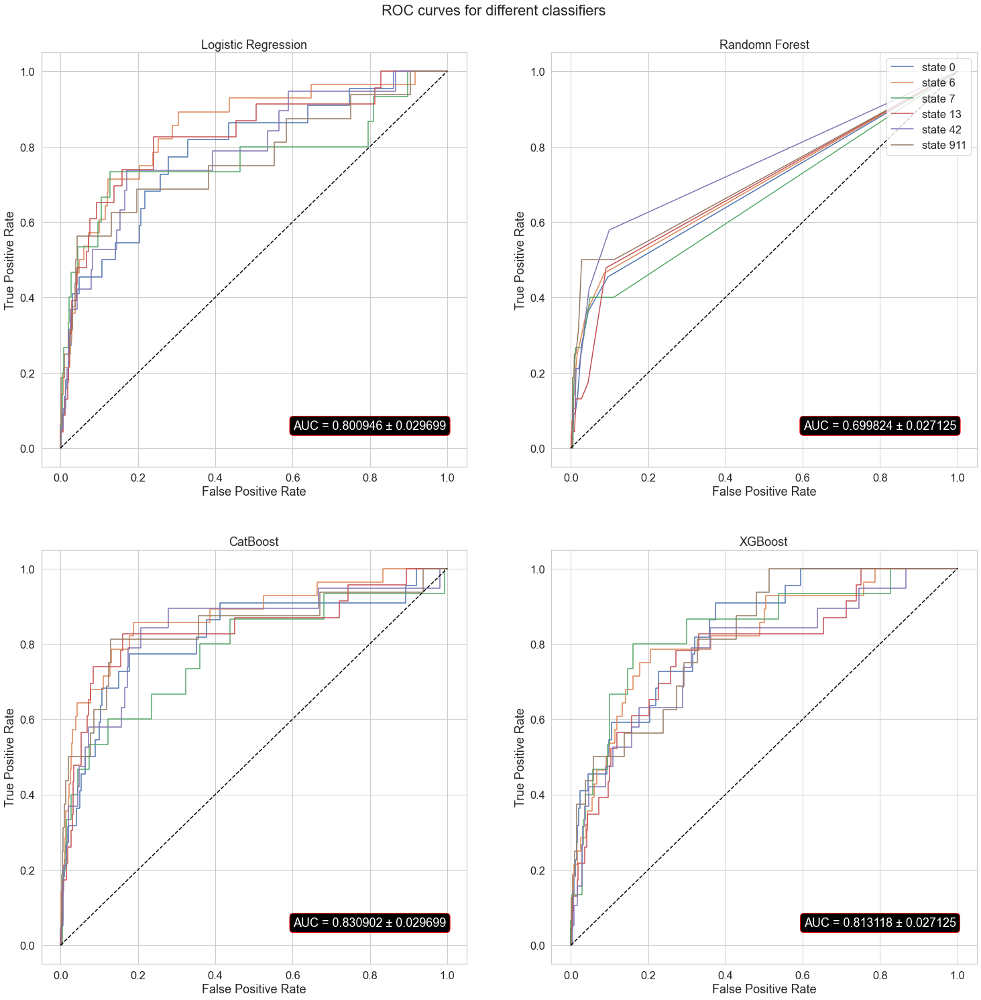

In [135]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test)

In [136]:
X['in_center1'] = np.where(X['Px'] ** 2 + X['Py'] ** 2 < 0.01, 1, 0)
X['in_center2'] = np.where(np.abs(X['Px']) < 0.1, 1, 0)
X['in_center3'] = np.where(np.abs(X['Py']) < 0.1, 1, 0)

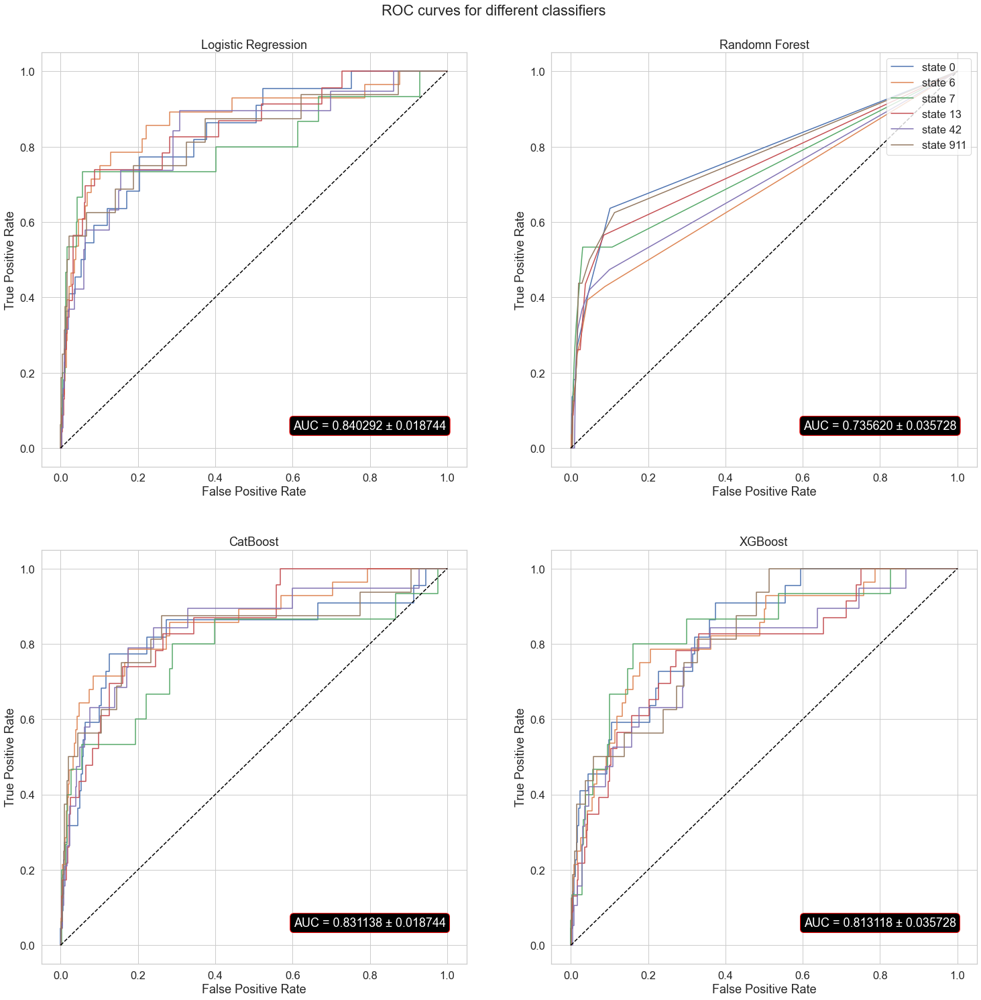

In [137]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    split = train_test_split(X.drop(['Px'], axis=1), y, test_size=0.3, random_state=state)

    X_train.append(split[0])
    X_test.append(split[1])
    y_train.append(split[2])
    y_test.append(split[3])
    
get_metrics(X_train, X_test, y_train, y_test, cat_ft=['in_center1', 'in_center2', 'in_center3'])

>SMOTE

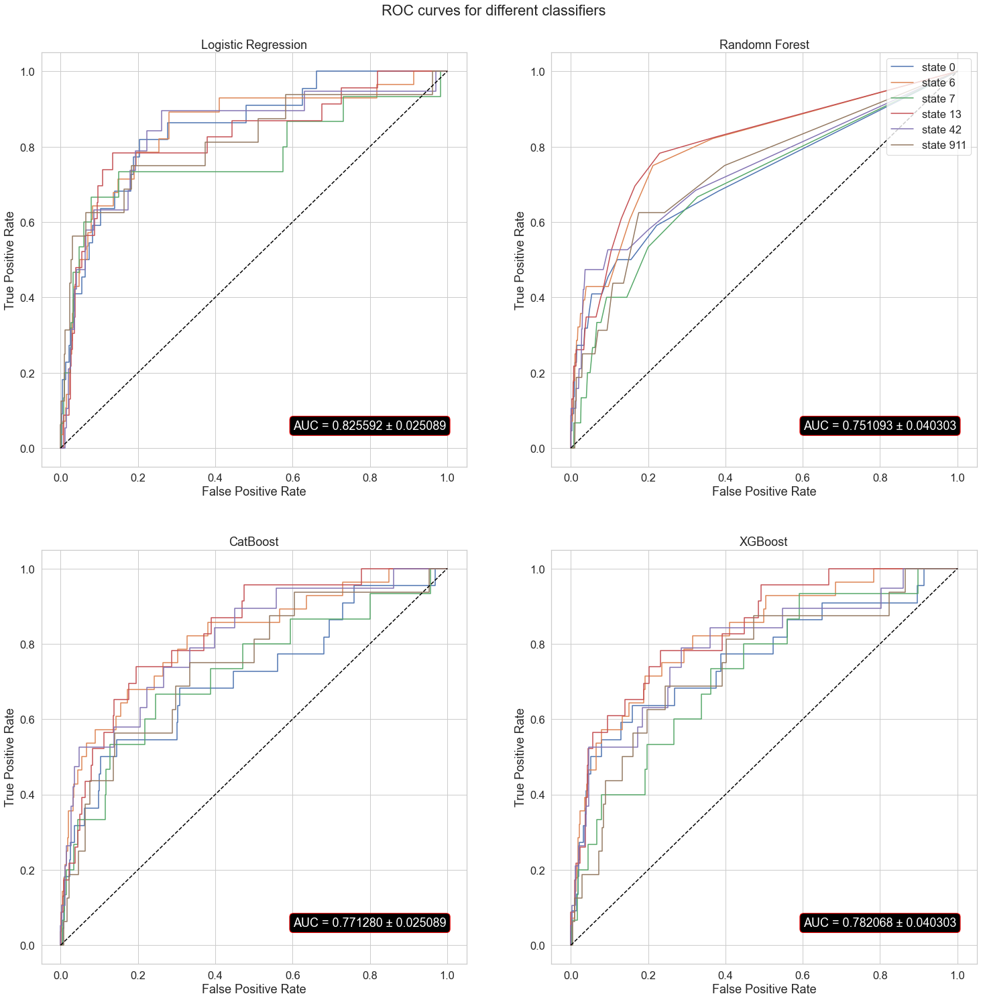

In [138]:
X_train = []
X_test = []
y_train = []
y_test = []

for state in states:
    
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=state)

    os = SMOTE(random_state=42, n_jobs=-1)

    columns = Xtrain.columns

    os_data_X, os_data_y = os.fit_resample(Xtrain, ytrain)

    os_data_X = pd.DataFrame(data=os_data_X, columns=columns)

    X_train.append(os_data_X)
    X_test.append(Xtest)
    y_train.append(os_data_y)
    y_test.append(ytest)

get_metrics(X_train, X_test, y_train, y_test, cat_ft=['in_center1', 'in_center2', 'in_center3'])

>## Соединение

In [139]:
X_train = []
X_test = []
y_train = []
y_test_1 = []

for state in states:
    
    threshold = [50, 150]

    X1 = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
    y1 = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

    X1['centr_dist1'] = X1['Px'] ** 2 + X1['Py'] ** 2
    X1['centr_dist2'] = X1['Px'] ** 2 + X1['Y'] ** 2
    X1['centr_dist2'] = X1['Py'] ** 2 + X1['X'] ** 2
    X1['centr_dist3'] = X1['X'] ** 2 + X1['Y'] ** 2

    k1, b1 = np.polyfit(X1[y1 == 0]['Px'], X1[y1 == 0]['X'], deg=1)
    X1['line_dist1'] = np.abs((X1['X'] -  (k1 * X1['Px'] + b1)) / (k1 ** 2 + 1) ** 0.5)
    
    k2, b2 = np.polyfit(X1[y1 == 0]['Py'], X1[y1 == 0]['Y'], deg=1)
    X1['line_dist2'] = np.abs((X1['Y'] -  (k2 * X1['Py'] + b2)) / (k2 ** 2 + 1) ** 0.5)

    X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=state)

    os = SMOTE(random_state=42, n_jobs=-1)
    columns = X1_train.columns
    os_data_X1, os_data_y1 = os.fit_resample(X1_train, y1_train)
    os_data_X1 = pd.DataFrame(data=os_data_X1, columns=columns)

    X_train.append(os_data_X1)
    X_test.append(X1_test)
    y_train.append(os_data_y1)
    y_test_1.append(y1_test)

model_1 = get_metrics(X_train, X_test, y_train, y_test_1, vis=False, proba=True)

In [140]:
X_train = []
X_test = []
y_train = []
y_test_2 = []

for state in states:
    
    threshold = [10, 50]

    X2 = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
    y2 = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

    X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=state)

    X_train.append(X2_train)
    X_test.append(X2_test)
    y_train.append(y2_train)
    y_test_2.append(y2_test)

model_2 = get_metrics(X_train, X_test, y_train, y_test_2, vis=False, proba=True)

In [141]:
X_train = []
X_test = []
y_train = []
y_test_3 = []

for state in states:

    threshold = [0, 10]

    X3 = data.drop(['type'], axis=1)[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]
    y3 = data[(data['Pz'] > threshold[0]) * (data['Pz'] < threshold[1])]['type']

    X3['centr_dist1'] = X3['Px'] ** 2 + X3['Py'] ** 2
    X3['axis_dist_Px'] = np.abs(X3['Px'])
    X3['axis_dist_Py'] = np.abs(X3['Py'])

    k1, b1 = np.polyfit(X3[y3 == 0]['Px'], X3[y3 == 0]['X'], deg=1)
    X3['line_dist1'] = np.abs((X3['X'] -  (k1 * X3['Px'] + b1)) / (k1 ** 2 + 1) ** 0.5)
    k2, b2 = np.polyfit(X3[y3 == 0]['Py'], X3[y3 == 0]['Y'], deg=1)
    X3['line_dist2'] = np.abs((X3['Y'] -  (k2 * X3['Py'] + b2)) / (k2 ** 2 + 1) ** 0.5)

    X3['in_center1'] = np.where(X3['Px'] ** 2 + X3['Py'] ** 2 < 0.01, 1, 0)
    X3['in_center2'] = np.where(np.abs(X3['Px']) < 0.1, 1, 0)
    X3['in_center3'] = np.where(np.abs(X3['Py']) < 0.1, 1, 0)

    X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.3, random_state=state)

    X_train.append(X3_train)
    X_test.append(X3_test)
    y_train.append(y3_train)
    y_test_3.append(y3_test)

model_3 = get_metrics(X_train, X_test, y_train, y_test_3, cat_ft=['in_center1', 'in_center2', 'in_center3'], vis=False, proba=True)

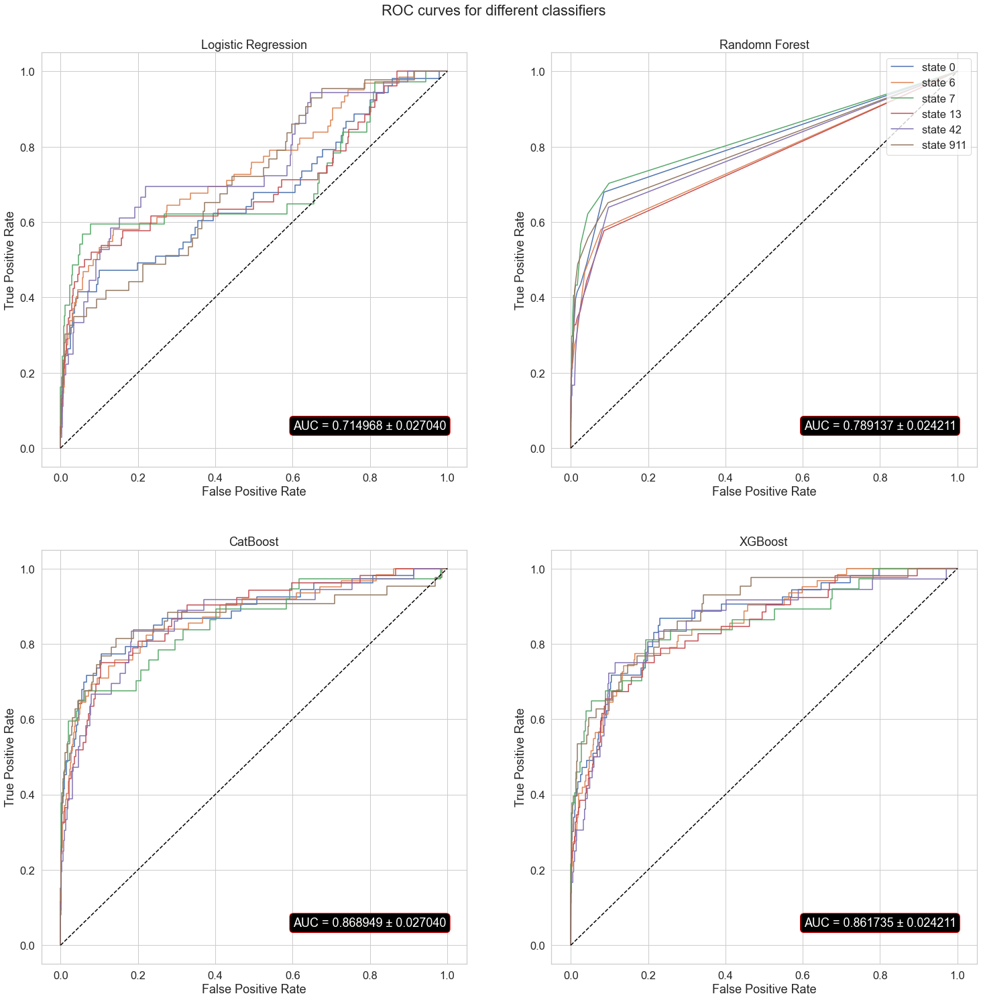

In [142]:
log_reg_auc = []
rnd_frst_auc = []
cat_bst_auc = []
xg_bst_auc = []

plt.figure(figsize=(25, 25))
plt.suptitle('ROC curves for different classifiers', y=0.92)

for i in range(len(states)):

    y_test = np.hstack((y_test_1[i], np.hstack((y_test_2[i], y_test_3[i]))))

    log_reg_proba = np.hstack((model_1[0][i], np.hstack((model_2[0][i], model_3[0][i]))))
    plt.subplot(2, 2, 1)
    fpr, tpr, _ = roc_curve(y_test, log_reg_proba)
    plt.plot(fpr, tpr)
    log_reg_auc.append(roc_auc_score(y_test, log_reg_proba))

    cat_bst_proba = np.hstack((model_1[2][i], np.hstack((model_2[2][i], model_3[2][i]))))
    plt.subplot(2, 2, 3)
    fpr, tpr, _ = roc_curve(y_test, cat_bst_proba)
    plt.plot(fpr, tpr)
    cat_bst_auc.append(roc_auc_score(y_test, cat_bst_proba))

    xg_bst_proba = np.hstack((model_1[3][i], np.hstack((model_2[3][i], model_3[3][i]))))
    plt.subplot(2, 2, 4)
    fpr, tpr, _ = roc_curve(y_test, xg_bst_proba)
    plt.plot(fpr, tpr)
    xg_bst_auc.append(roc_auc_score(y_test, xg_bst_proba))

    rnd_frst_proba = np.hstack((model_1[1][i], np.hstack((model_2[1][i], model_3[1][i]))))
    plt.subplot(2, 2, 2)
    fpr, tpr, _ = roc_curve(y_test, rnd_frst_proba)
    plt.plot(fpr, tpr, label='state {}'.format(states[i]))
    rnd_frst_auc.append(roc_auc_score(y_test, rnd_frst_proba))

box = {'facecolor':'black', 'edgecolor': 'red', 'boxstyle': 'round'}

plt.subplot(2, 2, 1)
plt.title('Logistic Regression')
plt.plot([0, 1], [0, 1], linestyle='--', color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.text(0.8, 0.05, 'AUC = {:4f} ± {:4f}'.format(np.mean(log_reg_auc), np.std(log_reg_auc)), horizontalalignment = 'center', bbox = box, color = 'white')

plt.subplot(2, 2, 3)
plt.title('CatBoost')
plt.plot([0, 1], [0, 1], linestyle='--', color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.text(0.8, 0.05, 'AUC = {:4f} ± {:4f}'.format(np.mean(cat_bst_auc), np.std(log_reg_auc)), horizontalalignment = 'center', bbox = box, color = 'white')

plt.subplot(2, 2, 4)
plt.title('XGBoost')
plt.plot([0, 1], [0, 1], linestyle='--', color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.text(0.8, 0.05, 'AUC = {:4f} ± {:4f}'.format(np.mean(xg_bst_auc), np.std(rnd_frst_auc)), horizontalalignment = 'center', bbox = box, color = 'white')

plt.subplot(2, 2, 2)
plt.title('Randomn Forest')
plt.plot([0, 1], [0, 1], linestyle='--', color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.text(0.8, 0.05, 'AUC = {:4f} ± {:4f}'.format(np.mean(rnd_frst_auc), np.std(rnd_frst_auc)), horizontalalignment = 'center', bbox = box, color = 'white')

plt.legend(loc = 'upper right')

plt.show()